# Neighborhood and gradient gene analysis

In this tutorial, we show how to use Squidpy with external functions for neighborhood and gradient gene analysis from *Radkevich et al. (2024)* [[code](https://github.com/ismms-himc/visium_analysis)] on Visium data.

We will go through the following steps:

1. Load Visium H&E data.
2. Calculate neighborhood layers.
3. Perform gradient gene analysis.

To run the notebook locally, create a conda environment as `conda env create -f neighborhood_environment.yml` using this [neighborhood_environment.yml](https://github.com/emir-radkevich/squidpy_notebooks/blob/main/envs/neighborhood_environment.yml), which installs `visium_analysis` package.

## Import packages and data

In [14]:
import squidpy as sq
import scanpy as sc

from visium_analysis.distance import calc_all_neighbors, calc_lm_on_samples
from visium_analysis.plot_funcs import plot_spatial_scatter

In [2]:
adata = sq.datasets.visium_hne_adata_crop()

In [3]:
adata

AnnData object with n_obs × n_vars = 684 × 18078
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

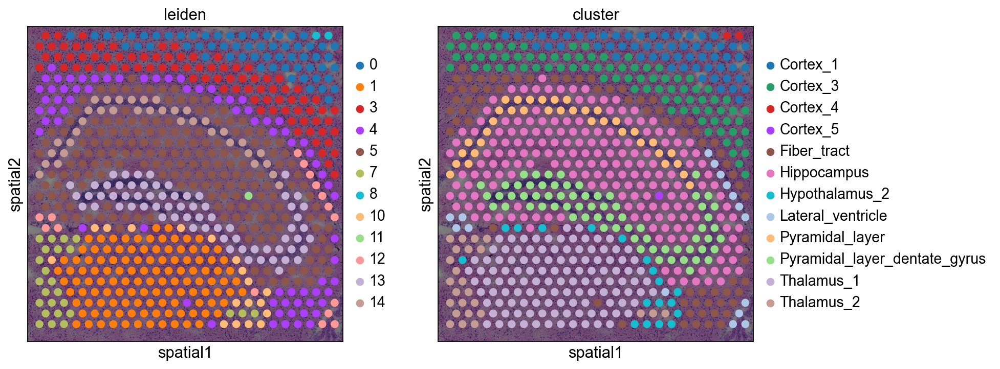

In [4]:
sq.pl.spatial_scatter(
    adata=adata, 
    color=['leiden','cluster']
)

## Calculate neighborhood layers on adata

Let's pick `Fiber_tract` structure as an area of interest for which we will calculate neighborhood layers.  
We will calculate the layers outside and inside the structure.

In [5]:
adata

AnnData object with n_obs × n_vars = 684 × 18078
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
ad = calc_all_neighbors(
    adata=adata,
    cat='cluster',
    celltype='Fiber_tract',
    n=4,
    sample_obs_key=None,
    samples=None,
    noncumulative=True,
    add_intra=True,
    intra_only=False
)

100%|████████████████████████████████████████████| 5/5 [00:00<00:00, 617.74it/s]


Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_0_c'
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_0_nc'
Cumulative neighborhood at the 100 micrometers distance is not calculated. Running it now.
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_1_c'
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_1_nc'
Cumulative neighborhood at the 200 micrometers distance is not calculated. Running it now.
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_2_c'
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_2_nc'
Cumulative neighborhood at the 300 micrometers distance is not calculated. Running it now.
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_3_c'
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_3_nc'
Cumulative 

 60%|██████████████████████████▍                 | 3/5 [00:00<00:00, 930.48it/s]

Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_0_intra'
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_-1_intra'
Annotation of neighbors is added in adata.uns['neighborhood'], column 'neighborhood_-2_intra'
-3th layer is empty. Previous one was already the core. Stopping the calculation.


In [7]:
ad.uns['neighborhood'].head()

,neighborhood_0_c,neighborhood_0_nc,neighborhood_1_c,neighborhood_1_nc,neighborhood_2_c,neighborhood_2_nc,neighborhood_3_c,neighborhood_3_nc,neighborhood_4_c,neighborhood_4_nc,neighborhood_0_intra,neighborhood_-1_intra,neighborhood_-2_intra
AAAGACCCAAGTCGCG-1,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,neighbor,neighbor,not neighbor,not neighbor,not neighbor
AAAGGGATGTAGCAAG-1,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor
AAAGTCACTGATGTAA-1,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,neighbor,neighbor,not neighbor,not neighbor,not neighbor
AAATGGCATGTCTTGT-1,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor,not neighbor
AAATGGTCAATGTGCC-1,not neighbor,not neighbor,not neighbor,not neighbor,neighbor,neighbor,neighbor,not neighbor,neighbor,not neighbor,not neighbor,not neighbor,not neighbor


Here we will use custom plotting function, though you can use `sq.pl.spatial_scatter()`.  
The only thing is that you need to export results from `.uns` to `.obs` in order to use `sq.pl.spatial_scatter()`.

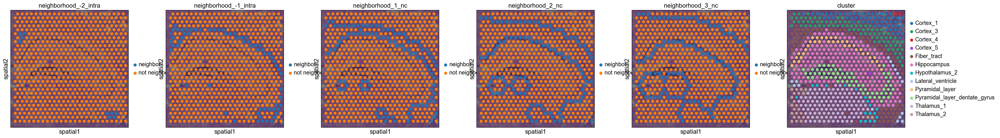

In [8]:
# define columns in .uns and .obs that need to be plotted
list_unpack = \
[*[f'neighborhood_{i}_intra' for i in range(-2,0)],
 *[f'neighborhood_{i}_nc' for i in range(1,4)],
 'cluster']

plot_spatial_scatter(ad, None, None, False, (5,5), *list_unpack)

## Perform gradient gene analysis

Here we will calculate linear regression on genes over the calculated neighborhood layers. 

Regression coefficients per each layer for each gene are then used to assess whether they \[coefficients\] are forming line deviating from a flat line. If the slope is positive, we say that this gene is an UP gene, i.e. it is expressed more in the neighborhood of an area of interest. If the slope is negative, we call this gene a DOWN gene, i.e. it is more expressed in the area of interest.  

Note: make sure that you have log-transformed counts in the matrix.

While running `calc_lm_on_samples`, it throws `statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0` warning message. Let's not capture it in this Jupyter Notebook cell.

In [9]:
%%capture --no-stdout

a=calc_lm_on_samples(
    adata=ad,
    sample_obs_key=None,
    samples=None,
    nonzero_counts=.7,
    use_mixedlm=False,
    return_regression_coef=True
)

Running GLM.
Calculating linear model on one sample.
Length of genes of interest = 2555


In [10]:
a

Phldb1   -0.319005
Cers2    -0.316502
Gsn      -0.306267
Opalin   -0.300422
Pllp     -0.283151
            ...   
Lrrn2     0.242142
Nt5dc3    0.271805
Elmo2     0.272870
Stum      0.325022
Cpne6     0.338457
Length: 2555, dtype: float64

Let's pick first 12 genes, i.e. top 12 DOWN genes that should be expressed more in the close viccinity of an area of interest.

We see a gradient starting from the area of interest (Fiber_tract).

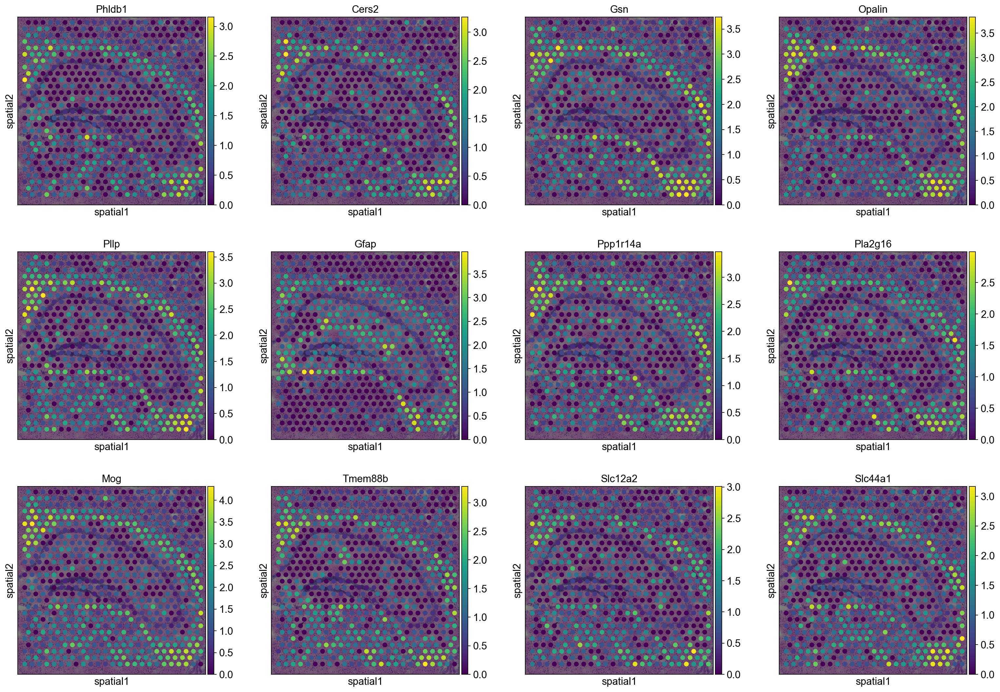

In [11]:
sq.pl.spatial_scatter(
    adata=ad, 
    color=a.index[:12], 
    use_raw=False
)

The above genes might not be the same that you can get from differential gene expression analysis. Below top 11 genes mined from differential gene expression analysis.

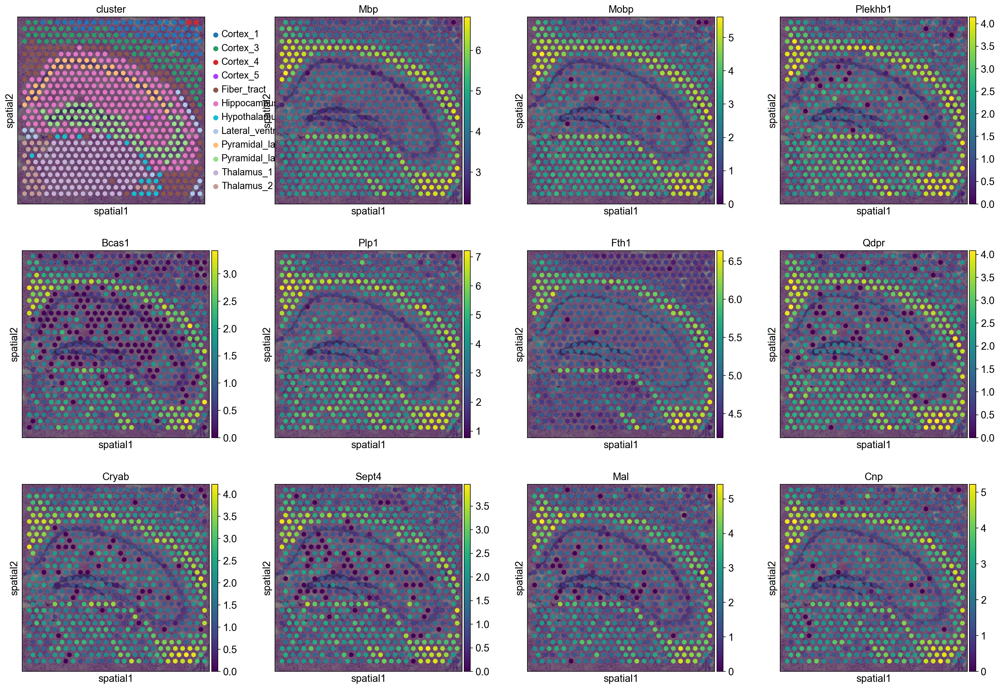

In [15]:
dge_genes = sc.get.rank_genes_groups_df(adata=adata, group='4')\
['names'][:11].values.tolist()

sq.pl.spatial_scatter(
    adata=adata, 
    color=['cluster']+dge_genes, 
    use_raw=False
)

If you pick last 12 genes, i.e. top 12 UP genes, you will see genes higly expressed in the neighborhood of the area of interest.

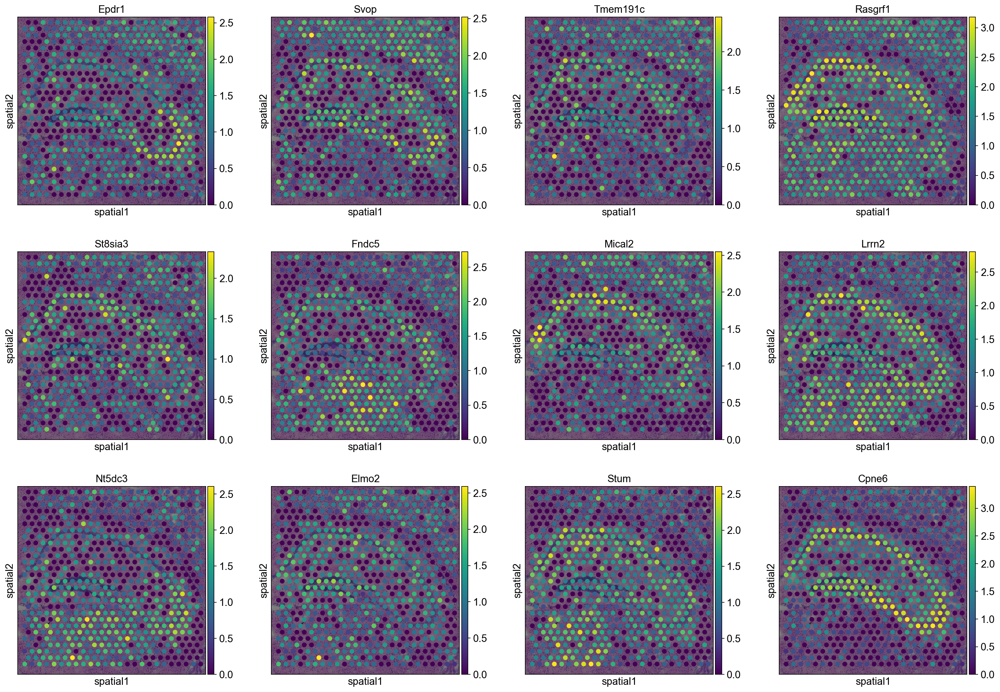

In [16]:
sq.pl.spatial_scatter(
    adata=ad, 
    color=a.index[-12:],
    use_raw=False
)